In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from datetime import datetime, timedelta

In [2]:
from plotly import __version__
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [3]:
init_notebook_mode(connected=True)
cf.go_offline()

In [4]:
df_wind_forecast = pd.read_csv('./48hr_forecast_even.csv', index_col=0, header = 0)
df_wind_forecast

,U_wind_Observed_15T,V_wind_Observed_15T,Borselle_00_U_100m,Borselle_00_V_100m,Borselle_S_U_100m,Borselle_S_V_100m,Borselle_SE_U_100m,Borselle_SE_V_100m,Borselle_NE_U_100m,Borselle_NE_V_100m,...,Borselle_NW_U_interp,Borselle_00_V_interp,Borselle_N_V_interp,Borselle_NE_V_interp,Borselle_E_V_interp,Borselle_SE_V_interp,Borselle_S_V_interp,Borselle_SW_V_interp,Borselle_W_V_interp,Borselle_NW_V_interp
Time,,,,,,,,,,,,,,,,,,,,,
2021-04-18 00:00:00,-1.651,-6.206,-0.184,-6.205,-0.212,-6.193,-0.266,-6.186,-0.215,-6.206,...,-0.056229,-5.943514,-5.942114,-5.939314,-5.942457,-5.941600,-5.944143,-5.945686,-5.945057,-5.943171
2021-04-18 00:15:00,-1.679,-5.978,-0.030,-6.256,-0.056,-6.228,-0.111,-6.220,-0.064,-6.266,...,0.103486,-5.951429,-5.958086,-5.956229,-5.949343,-5.939200,-5.940514,-5.939343,-5.948771,-5.956686
2021-04-18 00:30:00,-1.617,-5.612,0.039,-6.321,0.019,-6.282,-0.038,-6.267,-0.002,-6.337,...,0.167657,-5.986714,-6.003400,-5.996771,-5.982086,-5.967629,-5.970000,-5.967886,-5.988343,-6.011000
2021-04-18 00:45:00,-1.660,-5.248,0.020,-6.345,0.007,-6.305,-0.049,-6.282,-0.025,-6.352,...,0.146114,-5.995857,-6.018714,-6.001371,-5.983000,-5.964057,-5.972200,-5.980314,-6.008943,-6.034543
2021-04-18 01:00:00,-1.606,-4.959,-0.028,-6.339,-0.040,-6.299,-0.091,-6.275,-0.062,-6.351,...,0.096857,-5.996543,-6.023400,-6.007057,-5.980457,-5.954086,-5.967686,-5.982771,-6.013143,-6.041743
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-30 22:45:00,-8.486,-7.641,-10.137,-6.354,-10.169,-6.535,-10.179,-6.481,-10.094,-6.202,...,-9.690057,-6.154171,-6.019343,-6.012571,-6.112629,-6.273743,-6.325514,-6.322943,-6.181457,-6.054914
2022-08-30 23:00:00,-8.579,-7.521,-10.015,-6.259,-10.000,-6.371,-10.049,-6.406,-10.000,-6.148,...,-9.628771,-6.068086,-5.961800,-5.963029,-6.076600,-6.208400,-6.184543,-6.131114,-6.026971,-5.927029
2022-08-30 23:15:00,-8.583,-7.164,-9.961,-6.197,-9.841,-6.159,-9.939,-6.302,-10.109,-6.200,...,-9.576886,-6.029114,-5.988686,-6.017257,-6.106514,-6.124457,-6.002257,-5.843314,-5.890400,-5.905286


In [5]:
df_wind_forecast['Observed_windspeed'] = np.sqrt(df_wind_forecast['U_wind_Observed_15T']**2 + df_wind_forecast['V_wind_Observed_15T']**2)

In [6]:
df_wind_forecast['Borselle_00_windspeed_interp'] = np.sqrt(df_wind_forecast['Borselle_00_U_interp']**2 + df_wind_forecast['Borselle_00_V_interp']**2)
df_wind_forecast['Borselle_N_windspeed_interp'] = np.sqrt(df_wind_forecast['Borselle_N_U_interp']**2 + df_wind_forecast['Borselle_N_V_interp']**2)
df_wind_forecast['Borselle_NE_windspeed_interp'] = np.sqrt(df_wind_forecast['Borselle_NE_U_interp']**2 + df_wind_forecast['Borselle_NE_V_interp']**2)
df_wind_forecast['Borselle_E_windspeed_interp'] = np.sqrt(df_wind_forecast['Borselle_E_U_interp']**2 + df_wind_forecast['Borselle_E_V_interp']**2)
df_wind_forecast['Borselle_SE_windspeed_interp'] = np.sqrt(df_wind_forecast['Borselle_SE_U_interp']**2 + df_wind_forecast['Borselle_SE_V_interp']**2)
df_wind_forecast['Borselle_S_windspeed_interp'] = np.sqrt(df_wind_forecast['Borselle_S_U_interp']**2 + df_wind_forecast['Borselle_S_V_interp']**2)
df_wind_forecast['Borselle_SW_windspeed_interp'] = np.sqrt(df_wind_forecast['Borselle_SW_U_interp']**2 + df_wind_forecast['Borselle_SW_V_interp']**2)
df_wind_forecast['Borselle_W_windspeed_interp'] = np.sqrt(df_wind_forecast['Borselle_W_U_interp']**2 + df_wind_forecast['Borselle_W_V_interp']**2)
df_wind_forecast['Borselle_NW_windspeed_interp'] = np.sqrt(df_wind_forecast['Borselle_NW_U_interp']**2 + df_wind_forecast['Borselle_NW_V_interp']**2)

In [7]:
df_wind_forecast['Borselle_gridmean_windspeed_interp'] = df_wind_forecast[['Borselle_00_windspeed_interp', 'Borselle_N_windspeed_interp',
                                                        'Borselle_NE_windspeed_interp', 'Borselle_E_windspeed_interp',
                                                        'Borselle_SE_windspeed_interp', 'Borselle_S_windspeed_interp',
                                                        'Borselle_SW_windspeed_interp', 'Borselle_W_windspeed_interp',
                                                        'Borselle_NW_windspeed_interp']].mean(axis=1)

In [8]:
df_wind_forecast = df_wind_forecast.reset_index()
df_wind_forecast['Time'] = pd.DatetimeIndex(df_wind_forecast['Time'])

In [9]:
from scipy.stats import percentileofscore
from statsmodels.distributions.empirical_distribution import ECDF

In [10]:
def QM_replace(obs_dataset, forecast_train, forecast_test):
        """
        For each model_future value, get its percentile on the CDF of model_present,
        then ust it to get a value from the model_present.
        returns: downscaled model_present and model_future        
        """
        forecast_train_QM = np.zeros(forecast_train.size)  
        forecast_test_QM = np.zeros(forecast_test.size)

        for ival, model_value in enumerate(forecast_train):
            percentile = percentileofscore(forecast_train, model_value) # calculates the percentile rank of a score relative to a list of scores
            forecast_train_QM[ival] = np.percentile(obs_dataset, percentile)

        for ival, model_value in enumerate(forecast_test):
            percentile = percentileofscore(forecast_train, model_value)
            forecast_test_QM[ival] = np.percentile(obs_dataset, percentile)
            
        return forecast_train_QM, forecast_test_QM

In [11]:
dt = df_wind_forecast.iloc[0]['Time']
start = dt - timedelta(days=dt.weekday())
end = start + timedelta(days=50)   # This index should be changed so 'end' marks the end of the initial training period in days.
print(start)
print(end)

2021-04-12 00:00:00
2021-06-01 00:00:00


In [12]:
ind1 = (df_wind_forecast['Time'] == pd.Timestamp(end)).argmax() # ind1 is the index of the end of the training period
print(ind1)

dt_1 = end
end_1 = dt_1 + timedelta(days=1)
print(start)
print(dt_1)
print(end_1)

ind2 = (df_wind_forecast['Time'] == pd.Timestamp(end_1)).argmax() # ind2 is the index of the end of the testing period
print(ind2)

4224
2021-04-12 00:00:00
2021-06-01 00:00:00
2021-06-02 00:00:00
4320


# QM on first 24hours

In [13]:
df_QM_loop = pd.DataFrame(df_wind_forecast['Observed_windspeed'])
df_QM_loop['Borselle_gridmean_windspeed_interp'] = df_wind_forecast['Borselle_gridmean_windspeed_interp']
df_QM_loop['Time'] = df_wind_forecast['Time']
    
df_1 = df_QM_loop[:ind1].dropna()
df_2 = df_QM_loop[ind1:ind2].dropna()      
                     
obs_dataset = df_1['Observed_windspeed']
forecast_train = df_1['Borselle_gridmean_windspeed_interp']
forecast_test = df_2['Borselle_gridmean_windspeed_interp']
forecast_train_time = df_1['Time']
forecast_test_time = df_2['Time']

forecast_train_QM=[]
forecast_test_QM=[]
forecast_train_QM, forecast_test_QM = QM_replace(obs_dataset, forecast_train, forecast_test)

df = pd.DataFrame(np.hstack([df_1['Borselle_gridmean_windspeed_interp'],forecast_test_QM]))
df_time = pd.DataFrame(np.hstack([df_1['Time'],forecast_test_time]))

C:\Users\nick.reynard\AppData\Local\Temp\ipykernel_14624\3480254670.py:4: RuntimeWarning:

invalid value encountered in subtract



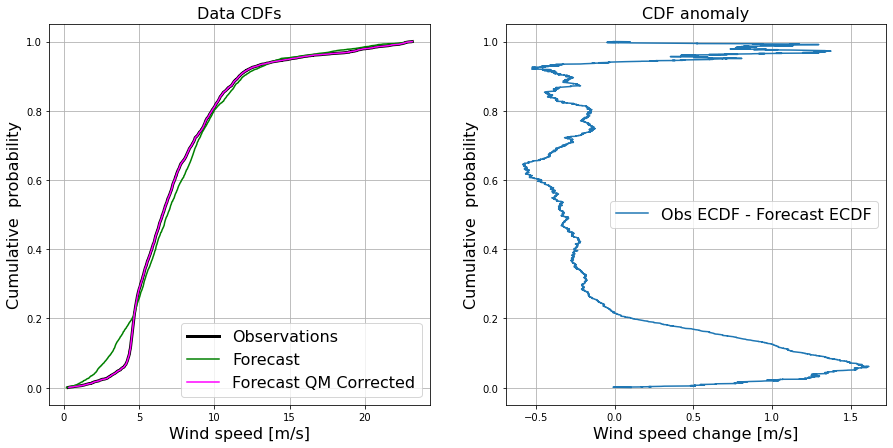

In [15]:
ecdf_for= ECDF(df_1['Borselle_gridmean_windspeed_interp'][:ind1])
ecdf_obs = ECDF(df_1['Observed_windspeed'][:ind1])

diff = ecdf_obs.x - ecdf_for.x
ecdf_diff =  ECDF(forecast_train_QM)

plt.figure(figsize=(15,7))
plt.subplot(1,2,2)
plt.plot(diff, ecdf_obs.y, label = 'Obs ECDF - Forecast ECDF')
plt.legend(fontsize=16)
plt.title('CDF anomaly',fontsize=16)
plt.xlabel('Wind speed change [m/s]',fontsize=16)
plt.ylabel('Cumulative  probability',fontsize=16)
plt.grid()

plt.subplot(1,2,1)
plt.plot(ecdf_obs.x, ecdf_obs.y, label = 'Observations',color = 'black',linewidth=3)
plt.plot(ecdf_for.x, ecdf_for.y, label = 'Forecast',color = 'green')
plt.plot(ecdf_diff.x, ecdf_diff.y, label = 'Forecast QM Corrected',color = 'magenta')
plt.legend(fontsize=16)
plt.title('Data CDFs',fontsize=16)
plt.xlabel('Wind speed [m/s]',fontsize=16)
plt.ylabel('Cumulative  probability',fontsize=16)
plt.grid()
#plt.savefig("initial_CDF.jpeg",bbox_inches='tight')

# QM on remaining data


In [16]:
timeseries_len = int((len(df_wind_forecast)-ind1)/96) # This marks the number of days left to QM correct

for i in np.linspace(1,timeseries_len-1,timeseries_len-1): # can set this to the length of days wanting to QM correct 
    
    ind1 = ind2
    dt_1 = end_1
    start_1 = dt_1# - timedelta(days=dt_1.weekday())
    end_1 = start_1 + timedelta(days=1)
    ind2 = (df_wind_forecast['Time'] == pd.Timestamp(end_1)).argmax()
                     
    df_test = pd.DataFrame(df_wind_forecast['Observed_windspeed'])
    df_test['Borselle_gridmean_windspeed_interp'] = df_wind_forecast['Borselle_gridmean_windspeed_interp']
    df_test['Time'] = df_wind_forecast['Time']
    df_1 = df_test[:ind1].dropna()
    df_2 = df_test[ind1:ind2].dropna()      
                     
    obs_dataset = df_1['Observed_windspeed']
    forecast_train = df_1['Borselle_gridmean_windspeed_interp']
    forecast_test = df_2['Borselle_gridmean_windspeed_interp']
    forecast_train_time = df_1['Time']
    forecast_test_time = df_2['Time']

    forecast_train_QM=[]
    forecast_test_QM=[]
    forecast_train_QM, forecast_test_QM = QM_replace(obs_dataset, forecast_train, forecast_test)

    df = pd.DataFrame(np.hstack([df[0],forecast_test_QM]))
    df_time = pd.DataFrame(np.hstack([df_time[0],forecast_test_time]))

C:\Users\nick.reynard\AppData\Local\Temp\ipykernel_14624\2110054688.py:4: RuntimeWarning:

invalid value encountered in subtract



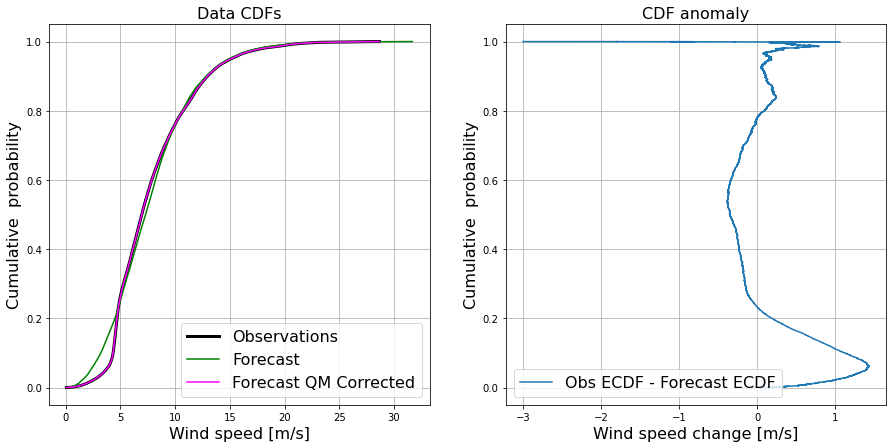

In [18]:
ecdf_for= ECDF(df_1['Borselle_gridmean_windspeed_interp'][:ind1])
ecdf_obs = ECDF(df_1['Observed_windspeed'][:ind1])

diff = ecdf_obs.x - ecdf_for.x
ecdf_diff =  ECDF(forecast_train_QM)

plt.figure(figsize=(15,7))
plt.subplot(1,2,2)
plt.plot(diff, ecdf_obs.y, label = 'Obs ECDF - Forecast ECDF')
plt.legend(fontsize=16)
plt.title('CDF anomaly',fontsize=16)
plt.xlabel('Wind speed change [m/s]',fontsize=16)
plt.ylabel('Cumulative  probability',fontsize=16)
plt.grid()

plt.subplot(1,2,1)
plt.plot(ecdf_obs.x, ecdf_obs.y, label = 'Observations',color = 'black',linewidth=3)
plt.plot(ecdf_for.x, ecdf_for.y, label = 'Forecast',color = 'green')
plt.plot(ecdf_diff.x, ecdf_diff.y, label = 'Forecast QM Corrected',color = 'magenta')
plt.legend(fontsize=16)
plt.title('Data CDFs',fontsize=16)
plt.xlabel('Wind speed [m/s]',fontsize=16)
plt.ylabel('Cumulative  probability',fontsize=16)
plt.grid()
#plt.savefig("end_CDF.jpeg",bbox_inches='tight')

In [19]:
df_QM = pd.DataFrame(df)
df_QM['Time'] = df_time[0]
df_QM = df_QM.set_index(pd.DatetimeIndex(df_QM['Time']))
df_QM.drop(['Time'],axis=1,inplace=True)

#df_new['Raw_forecast'] = df_test['Borselle_gridmean_windspeed_interp'].dropna()[:len(df_new)].values
df_QM['Observed_windspeed'] = df_test['Observed_windspeed'][:len(df_QM)].values
df_QM.columns=['QM_corrected', 'Observed_windspeed']

df_QM

,QM_corrected,Observed_windspeed
Time,,
2021-04-18 00:00:00,5.944763,6.421856
2021-04-18 00:15:00,5.949078,6.209310
2021-04-18 00:30:00,5.986916,5.840311
2021-04-18 00:45:00,5.996145,5.504281
2021-04-18 01:00:00,5.996557,5.212573
...,...,...
2022-08-29 22:45:00,8.870298,1.198180
2022-08-29 23:00:00,8.712523,1.028647
2022-08-29 23:15:00,8.532902,1.295914


In [20]:
df_wind_forecast = df_wind_forecast.set_index(pd.DatetimeIndex(df_wind_forecast['Time']))
df_wind_forecast['QM_corrected'] = df_QM['QM_corrected']

In [21]:
df_wind_forecast.columns

Index(['Time', 'U_wind_Observed_15T', 'V_wind_Observed_15T',
       'Borselle_00_U_100m', 'Borselle_00_V_100m', 'Borselle_S_U_100m',
       'Borselle_S_V_100m', 'Borselle_SE_U_100m', 'Borselle_SE_V_100m',
       'Borselle_NE_U_100m', 'Borselle_NE_V_100m', 'Borselle_E_U_100m',
       'Borselle_E_V_100m', 'Borselle_N_U_100m', 'Borselle_N_V_100m',
       'Borselle_NW_U_100m', 'Borselle_NW_V_100m', 'Borselle_SW_U_100m',
       'Borselle_SW_V_100m', 'Borselle_W_U_100m', 'Borselle_W_V_100m',
       'Borselle_00_U_50m', 'Borselle_00_V_50m', 'Borselle_N_U_50m',
       'Borselle_N_V_50m', 'Borselle_NE_U_50m', 'Borselle_NE_V_50m',
       'Borselle_E_U_50m', 'Borselle_E_V_50m', 'Borselle_SE_U_50m',
       'Borselle_SE_V_50m', 'Borselle_S_U_50m', 'Borselle_S_V_50m',
       'Borselle_SW_U_50m', 'Borselle_SW_V_50m', 'Borselle_W_U_50m',
       'Borselle_W_V_50m', 'Borselle_NW_U_50m', 'Borselle_NW_V_50m',
       'Borselle_00_U_interp', 'Borselle_N_U_interp', 'Borselle_NE_U_interp',
       'Borselle_E_

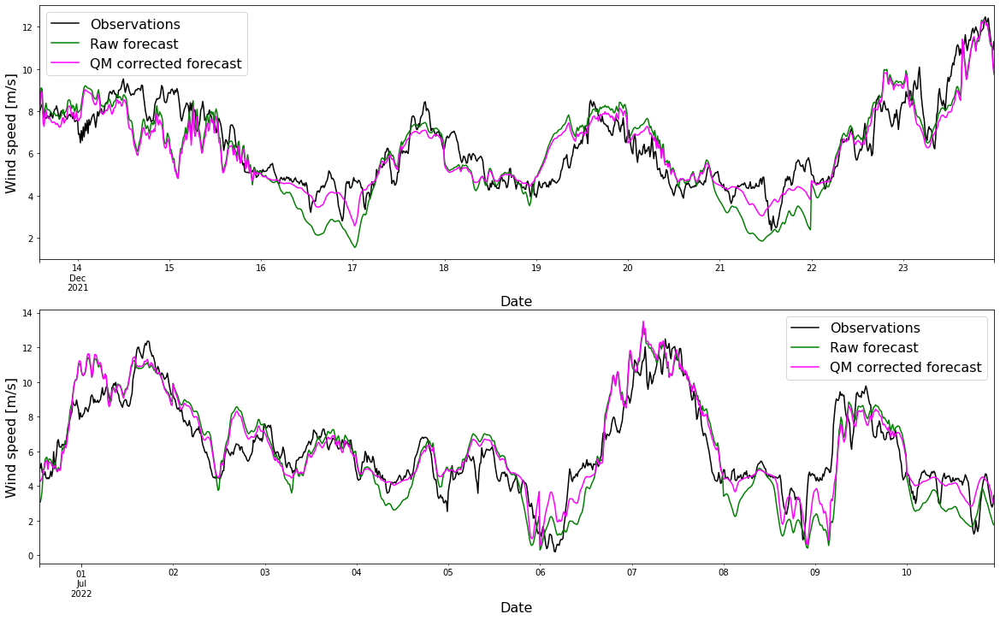

In [22]:
plt.figure(figsize=(20,12))

plt.subplot(2,1,1)
i = 23000
j = i+1000
df_wind_forecast['Observed_windspeed'][i:j].plot(color='black')
df_wind_forecast['Borselle_gridmean_windspeed_interp'][i:j].plot(color='green')
df_wind_forecast['QM_corrected'][i:j].plot(color='magenta')
plt.ylabel('Wind speed [m/s]',fontsize=16)
plt.xlabel('Date',fontsize=16)
plt.legend(['Observations','Raw forecast','QM corrected forecast'],fontsize=16)

plt.subplot(2,1,2)
i = 42100
j = i+1000
df_wind_forecast['Observed_windspeed'][i:j].plot(color='black')
df_wind_forecast['Borselle_gridmean_windspeed_interp'][i:j].plot(color='green')
df_wind_forecast['QM_corrected'][i:j].plot(color='magenta')
plt.ylabel('Wind speed [m/s]',fontsize=16)
plt.xlabel('Date',fontsize=16)
plt.legend(['Observations','Raw forecast','QM corrected forecast'],fontsize=16)
plt.savefig("timeseries_snapshot.jpeg",bbox_inches='tight')

In [23]:
df_wind_forecast[['Observed_windspeed','Borselle_gridmean_windspeed_interp','QM_corrected']].iplot()

In [24]:
df_wind_forecast_subset = pd.DataFrame(df_wind_forecast['Observed_windspeed'])
df_wind_forecast_subset['Raw_forecast'] = df_wind_forecast['Borselle_gridmean_windspeed_interp']
df_wind_forecast_subset['QM'] = df_wind_forecast['QM_corrected']

In [25]:
df_wind_forecast_subset.dropna(inplace=True)

from sklearn import metrics
print('Raw Forecast metrics')
print('MAE:', metrics.mean_absolute_error(df_wind_forecast_subset['Observed_windspeed'], df_wind_forecast_subset['Raw_forecast']))
print('MSE:', metrics.mean_squared_error(df_wind_forecast_subset['Observed_windspeed'], df_wind_forecast_subset['Raw_forecast']))
print('RMSE:', np.sqrt(metrics.mean_squared_error(df_wind_forecast_subset['Observed_windspeed'], df_wind_forecast_subset['Raw_forecast'])))
print('nRMSE:',np.sqrt(metrics.mean_squared_error(df_wind_forecast_subset['Observed_windspeed'], df_wind_forecast_subset['Raw_forecast']))/df_wind_forecast_subset['Observed_windspeed'].mean())
      
print('QM Forecast metrics')
print('MAE:', metrics.mean_absolute_error(df_wind_forecast_subset['Observed_windspeed'], df_wind_forecast_subset['QM']))
print('MSE:', metrics.mean_squared_error(df_wind_forecast_subset['Observed_windspeed'], df_wind_forecast_subset['QM']))
print('RMSE:', np.sqrt(metrics.mean_squared_error(df_wind_forecast_subset['Observed_windspeed'], df_wind_forecast_subset['QM'])))
print('nRMSE:',np.sqrt(metrics.mean_squared_error(df_wind_forecast_subset['Observed_windspeed'], df_wind_forecast_subset['QM']))/df_wind_forecast_subset['Observed_windspeed'].mean())


Raw Forecast metrics
MAE: 1.253805914788571
MSE: 2.889720035978358
RMSE: 1.6999176556464017
nRMSE: 0.2165036462121838
QM Forecast metrics
MAE: 1.1597245611651668
MSE: 2.639345824825804
RMSE: 1.6246063599610228
nRMSE: 0.20691190506949395


In [26]:
df_wind_forecast.to_csv('48hr_even_QM_corrected_forecast.csv') 

# Plots

In [27]:
df_wind_forecast.columns

Index(['Time', 'U_wind_Observed_15T', 'V_wind_Observed_15T',
       'Borselle_00_U_100m', 'Borselle_00_V_100m', 'Borselle_S_U_100m',
       'Borselle_S_V_100m', 'Borselle_SE_U_100m', 'Borselle_SE_V_100m',
       'Borselle_NE_U_100m', 'Borselle_NE_V_100m', 'Borselle_E_U_100m',
       'Borselle_E_V_100m', 'Borselle_N_U_100m', 'Borselle_N_V_100m',
       'Borselle_NW_U_100m', 'Borselle_NW_V_100m', 'Borselle_SW_U_100m',
       'Borselle_SW_V_100m', 'Borselle_W_U_100m', 'Borselle_W_V_100m',
       'Borselle_00_U_50m', 'Borselle_00_V_50m', 'Borselle_N_U_50m',
       'Borselle_N_V_50m', 'Borselle_NE_U_50m', 'Borselle_NE_V_50m',
       'Borselle_E_U_50m', 'Borselle_E_V_50m', 'Borselle_SE_U_50m',
       'Borselle_SE_V_50m', 'Borselle_S_U_50m', 'Borselle_S_V_50m',
       'Borselle_SW_U_50m', 'Borselle_SW_V_50m', 'Borselle_W_U_50m',
       'Borselle_W_V_50m', 'Borselle_NW_U_50m', 'Borselle_NW_V_50m',
       'Borselle_00_U_interp', 'Borselle_N_U_interp', 'Borselle_NE_U_interp',
       'Borselle_E_

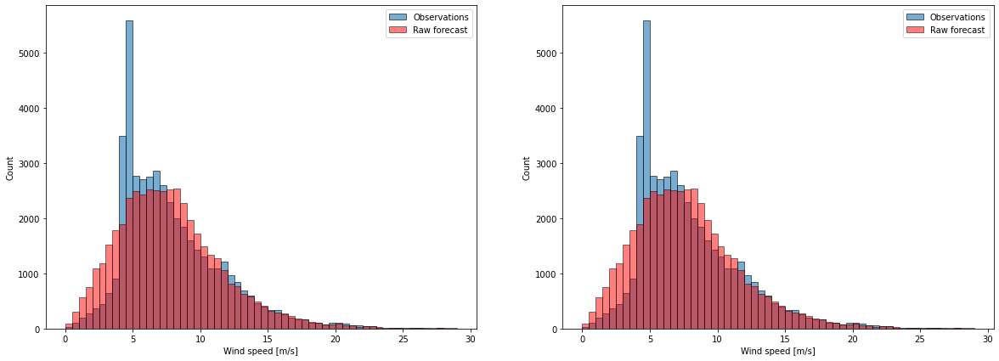

In [69]:
bins = np.linspace(0,29,59)

plt.figure(figsize=(20,7))
plt.subplot(1,2,1)
df_wind_forecast['Observed_windspeed'].plot(kind='hist',bins=bins,alpha=0.6,ec='black')
df_wind_forecast['Borselle_gridmean_windspeed_interp'].plot(kind='hist',bins=bins,alpha=0.5,ec='black',color='red')
#df_wind_forecast['QM_corrected'].plot(kind='hist',bins=bins,alpha=0.6,ec='black',color='green')
plt.xlabel('Wind speed [m/s]')
plt.ylabel('Count')
plt.legend(['Observations','Raw forecast'])

plt.subplot(1,2,2)
df_wind_forecast['Observed_windspeed'].plot(kind='hist',bins=bins,alpha=0.6,ec='black')
df_wind_forecast['Borselle_gridmean_windspeed_interp'].plot(kind='hist',bins=bins,alpha=0.5,ec='black',color='red')
#df_wind_forecast['QM_corrected'].plot(kind='hist',bins=bins,alpha=0.6,ec='black',color='green')
plt.xlabel('Wind speed [m/s]')
plt.ylabel('Count')
plt.legend(['Observations','Raw forecast'])
#plt.savefig("count_histogram_QM.jpeg",bbox_inches='tight',dpi=300)

Text(0, 0.5, 'Count')

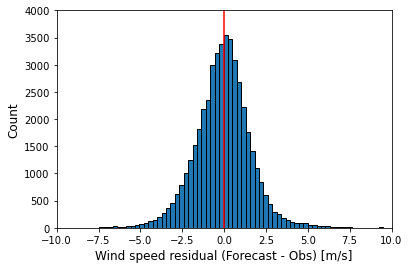

In [29]:
#df_wind_forecast['Residuals'] = df_wind_forecast['Observed_windspeed'] - df_wind_forecast['Borselle_gridmean_windspeed_interp']
df_wind_forecast['Residuals'] = df_wind_forecast['Borselle_gridmean_windspeed_interp'] - df_wind_forecast['Observed_windspeed']
#df_wind_forecast['Residuals'] = df_wind_forecast['QM_corrected'] - df_wind_forecast['Observed_windspeed']


plt.hist(df_wind_forecast['Residuals'],bins=90,edgecolor='black')

plt.vlines(0, 0, 4000, color='red')
plt.ylim([0,4000])
plt.xlim([-10,10])
#df_48hr
plt.xlabel('Wind speed residual (Forecast - Obs) [m/s]',fontsize=12)
plt.ylabel('Count',fontsize=12)
#plt.savefig("residual_histogram.jpeg",bbox_inches='tight')

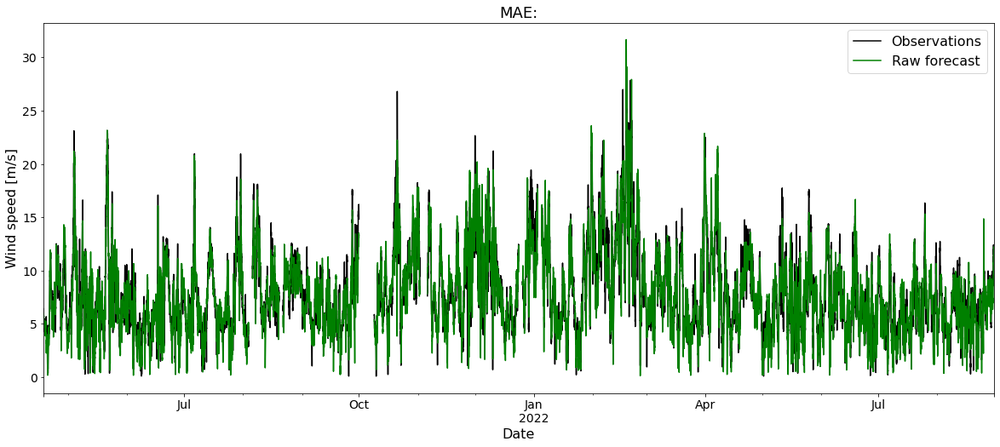

In [30]:

df_wind_forecast.plot(x = 'Time', y = ['Observed_windspeed','Borselle_gridmean_windspeed_interp'],figsize=(20,8),color=['black','green'])
plt.ylabel('Wind speed [m/s]',fontsize=16)
plt.xlabel('Date',fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.autoscale(enable=True, axis='x', tight=True)
plt.title('MAE:',fontsize=18)
plt.autoscale(enable=True, axis='x', tight=True)
plt.legend(['Observations','Raw forecast'],fontsize=16)